# Transform Domain and Linear Filters

---

In this practical work, we study some tools to analyze images in the space-frequency domain. We analyze the spectral content of different images and see the effects of aliasing and experiment with filtering in the frequency domain.

## 1 Lab configuration

First of all, we will make sure to install the requeried toolboxes for this excercise (you may need to re-start the runtime after this step):

In [1]:
!pip install --upgrade numpy scikit-image pillow plotly

It may be useful to have an efficient way to transfer data from your google drive to colaboratory. This can be done by mounting your google drive in the colaboratory environment. Use your own image (grayscale) and the provided `test1.bmp`:

In [2]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google'

In [ ]:
!wget "https://drive.google.com/uc?id=1eycfbbHEODVwvw0ZTNOC86W9SluaC-Lt" -O "test1.bmp"

Display the images to check they have been uploaded correctly. Please change the name of the file you uploaded in the previous section.

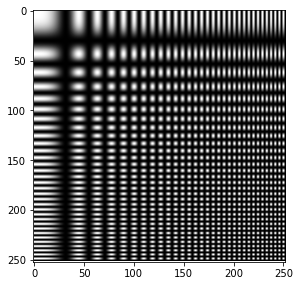

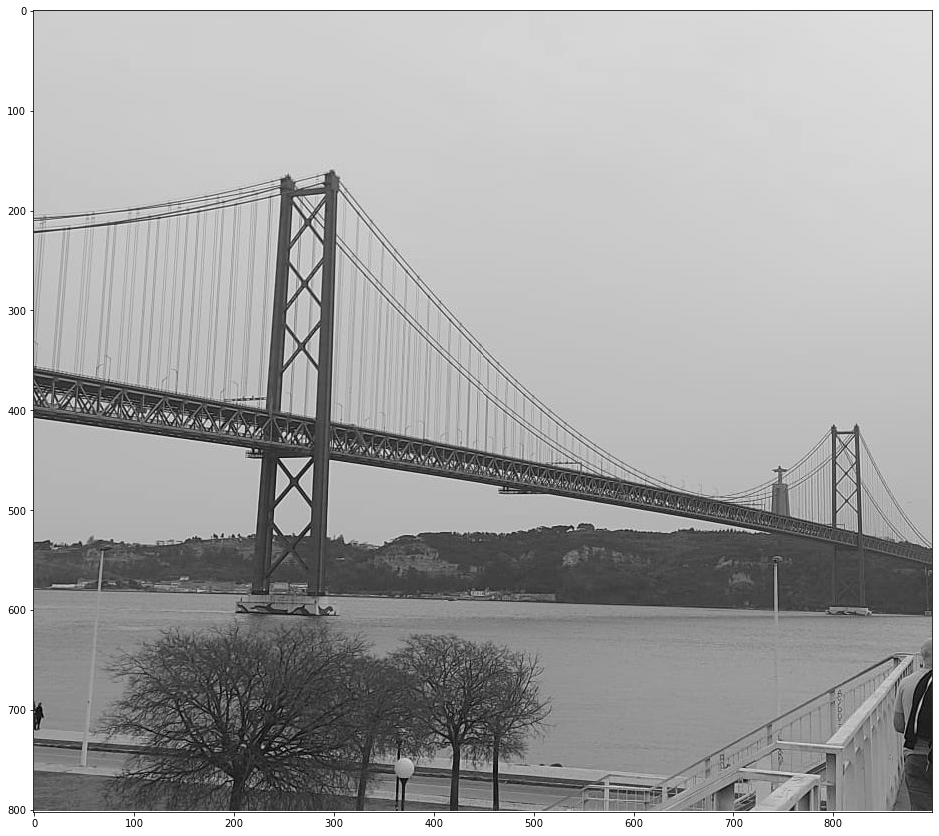

In [4]:
from skimage import io as skio
from skimage import transform as sktf
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

# Read the files from notebook disk
test1 = skio.imread('test1.bmp')
img = skio.imread('test2.bmp',as_gray=True)

def display_image(img, title='', size=None):
  #plt.subplot(1,2,1)
  plt.gray()
  h = plt.imshow(img, interpolation='none')
  if size:
    dpi = h.figure.get_dpi()/size
    h.figure.set_figwidth(img.shape[1] / dpi)
    h.figure.set_figheight(img.shape[0] / dpi)
    h.figure.canvas.manager.resize(img.shape[1] + 1, img.shape[0] + 1)
    h.axes.set_position([0, 0, 1, 1])
    h.axes.set_xlim(-1, img.shape[1])
    h.axes.set_ylim(img.shape[0], -1)
  plt.grid(False)
  plt.title(title)  
  plt.show()

def display_ft(ft, title='', centered=True):
  N = ft.shape[0]
  if centered:
    x = np.linspace(-0.5, 0.5, N)
    y = np.linspace(-0.5, 0.5, N)
  else:
    x = np.linspace(0, 1.0, N)
    y = np.linspace(0, 1.0, N)
  X, Y = np.meshgrid(x, y)
  fig = go.Figure(data=[go.Surface(z=ft,x=X,y=Y)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='Fx', yaxis_title='Fy', zaxis_title='FT'))
  fig.show()

def display_dft(ft, title=''):
  fig = go.Figure(data=[go.Surface(z=ft)])
  fig.update_layout(title=title)
  fig.update_layout(scene = dict(xaxis_title='k', yaxis_title='l', zaxis_title='DFT'))
  fig.show()

display_image(test1, size=1)
display_image(img, size=1)

## 2	Discrete Fourier Transform (DFT) and its representation


---


Now we'll display the transforms of these images. We'll benefit from the case-sensitive of python to name the transform in capital letters. First, we compute the transform:


In [5]:
IMG = np.fft.fft2(img)


Then, we display its modulus. We need to display the values in a logarithmic scale (you can try what would happen if we use the linear scale, i.e. without the log):

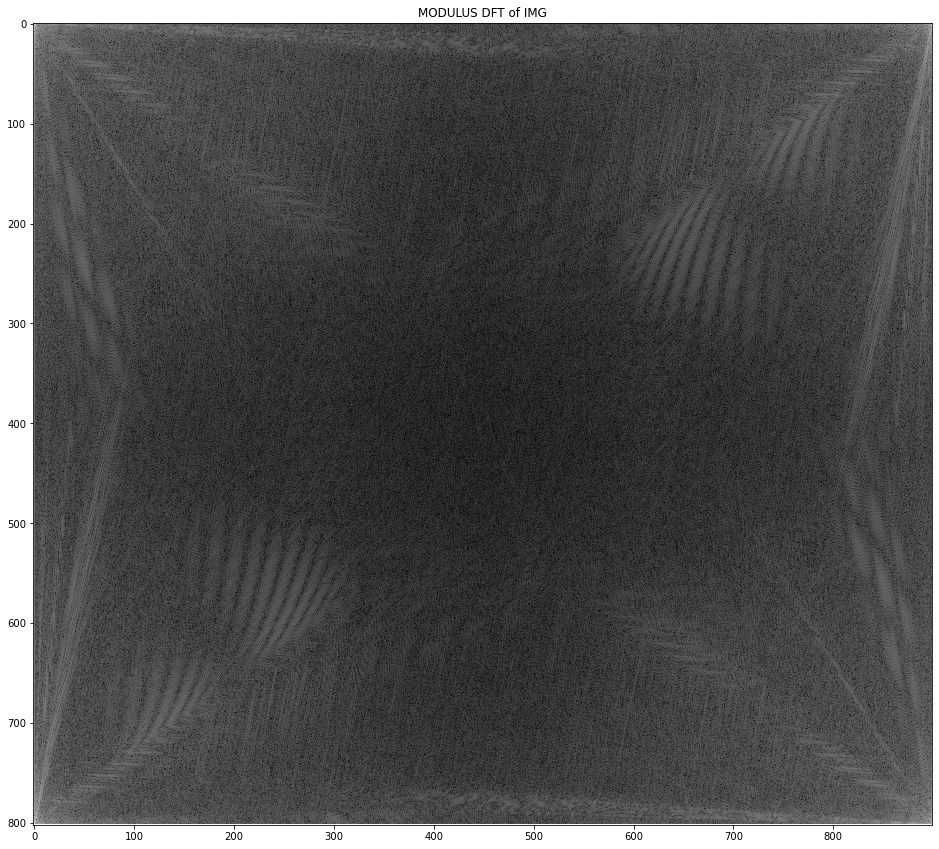

In [6]:
display_image(np.log(1+np.abs(IMG)), title='MODULUS DFT of IMG', size=1)

The DC component in the transform domain of IMG is located in the top left corner of the display. Remember that the spectrum of a discrete signal is $2\pi$-periodic. The DFT represents with N samples (if N is the length of the transform) one period of the spectrum. In 2D, the transform image has period $NxN$. In fact, the transform matrix IMG that we have computed presents only the samples of the fundamental period from $[0,2\pi) x [0,2\pi)$.

To visualize image transforms, we use to display the DC component in the center of the picture. In this way, it is easier to see the conjugate symmetry of the transform of a real signal. We use the function fftshift() to do this: 

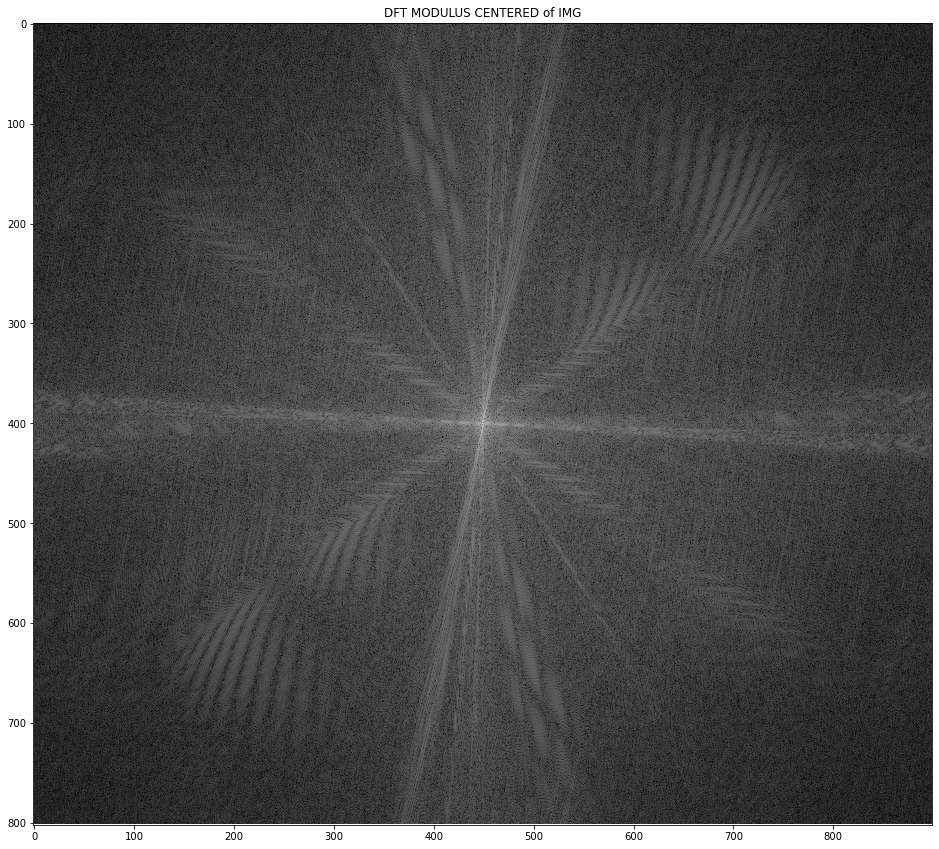

In [7]:
IMG_mod=np.fft.fftshift(np.log(1+np.abs(IMG)))
display_image(IMG_mod, title='DFT MODULUS CENTERED of IMG', size=1)

<font color='purple'>Try to relate details observed in the image spectra with the original content.</font>

---
<font color='red'>Answer: In the transformed image, we can observe different frequency patterns.

<font color='red'>1) The slightly right-leaning vertical lines represent the horizontal stripes transitioning from land to sky and sea. In the original image, they follow the y-axis, but in the frequency domain, they become vertical. Since the contours are unique (meaning there's only one transition from land to sky), the pattern is completely smooth.

<font color='red'>2) Conversely, the left-leaning vertical pattern resembles a grid. This is because it represents the frequency of the bridge's horizontal structure, which also exhibits this pattern. This structure exhibits very high intensity changes, which, when translated to the frequency domain, imply high-frequency components.

<font color='red'>3) The striped black-and-white pattern resembling a zebra corresponds to the wiring of the bridge. As mentioned earlier, this is due to numerous contrasts in a small space.

<font color='red'>4) Lastly, the horizontal line represents the frequency of the bridge's vertical tower, which, despite also having contrasts with the background, are quantitatively lower.

Now, you can follow the same process for `test1` image to generate the modulus of its transform. Write the necessary  commands. As before, use capital letters to name the transform: `TEST1` and `TEST1_mod`. As can be seen, the `test1` image is a low pass signal. 

In [8]:
# Display test1 DFT
TEST1 = np.fft.fft2(test1)

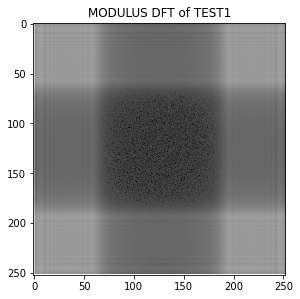

In [9]:
display_image(np.log(1+np.abs(TEST1)), title='MODULUS DFT of TEST1', size=1)

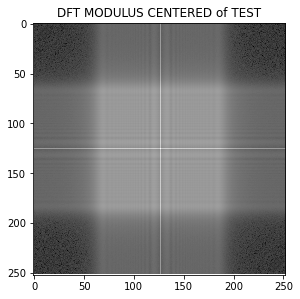

In [10]:
TEST1_mod=np.fft.fftshift(np.log(1+np.abs(TEST1)))
display_image(TEST1_mod, title='DFT MODULUS CENTERED of TEST', size=1)

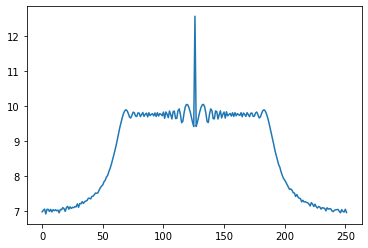

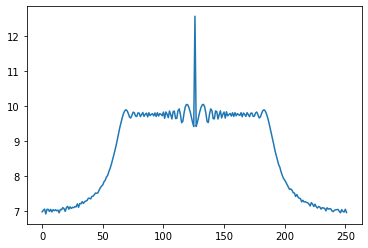

In [12]:
plt.plot(TEST1_mod[100])
plt.show()
plt.plot(TEST1_mod[:,100])
plt.show()


<font color='purple'>Estimate the horizontal and the vertical bandwidth of the image (give your answer with normalized frequencies).</font>

---
<font color='red'>Answer: Taking a quick glance, it seems that the DFT is a symmetric image, so one would expect the same bandwidth for both axes. To verify this, we plot the frequency for each axis separately and indeed confirm that they are practically identical.

<font color='red'>Visually, we can see that we have energy approximately between sample 50 and 200. Therefore, we have a bandwidth of 150 samples, which, if normalized by the total of 250 samples, gives us a normalized bandwidth of **0.6** (150/250).

## 3 Down sampling and aliasing


---

Nyquist theorem establishes that we should limit the bandwidth of a given signal before sampling (or downsampling) to half the new sampling frequency. Otherwise, aliasing might occur. In this section, we are going to downsample images without filtering, and see what happens in the resulting spectra. We are going to use the function [resize](http://scikit-image.org/docs/stable/api/skimage.transform.html#resize) from the skimage toolbox. To downsample an image by a factor 3, you can use it as follows. You can use the parameter `size` to zoom the figure without doing any upsampling.

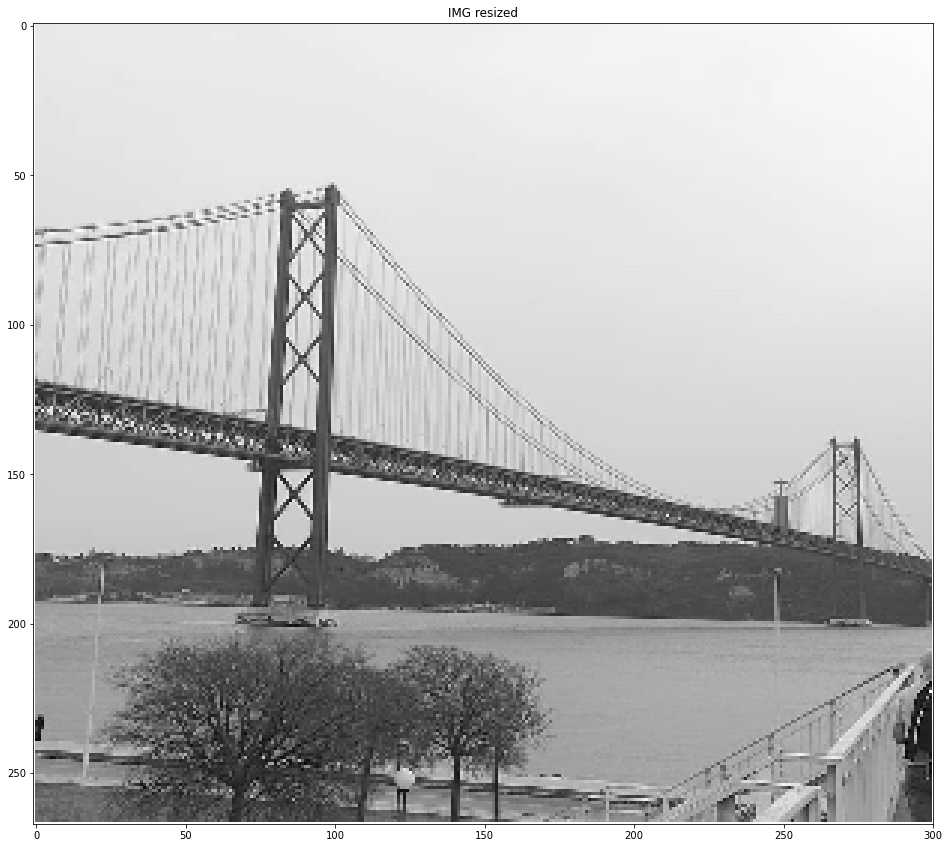

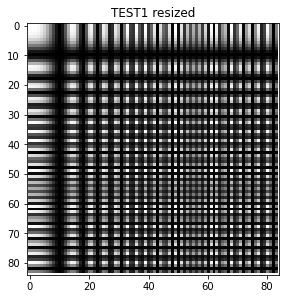

In [11]:
from skimage import transform

img_sub = transform.resize(img,np.asarray(img.shape)/3, anti_aliasing=False, mode='constant');
display_image(img_sub,title='IMG resized', size=3)

test1_sub=transform.resize(test1,np.asarray(test1.shape)/3, anti_aliasing=False, mode='constant');
display_image(test1_sub, title='TEST1 resized', size=3)



<font color='purple'>Can you interpret the results? Is there any special effect? Try to explain the effect you see when displaying the downsampled version of `test1`.</font>

---
<font color='red'>Answer: We can clearly see how both images lose quality as we reduce the total number of pixels. Additionally, in img, we observe that the cables are no longer straight and appear distorted, while in test1, the smaller grids have lost their rectangular/square shape.

<font color='red'>These two phenomena are due to the effect of aliasing. Specifically, aliasing causes the overlapping of cables/squares, resulting in the loss of their original shape. This effect only occurs with high frequencies, in our case above the values of 0.16 (according to the Nyquist theorem, aliasing affects frequencies higher than 1/2N, where N is the downsampling factor, in our case 3).
</font>


Let's see the spectra of these images before and after the downsampling:

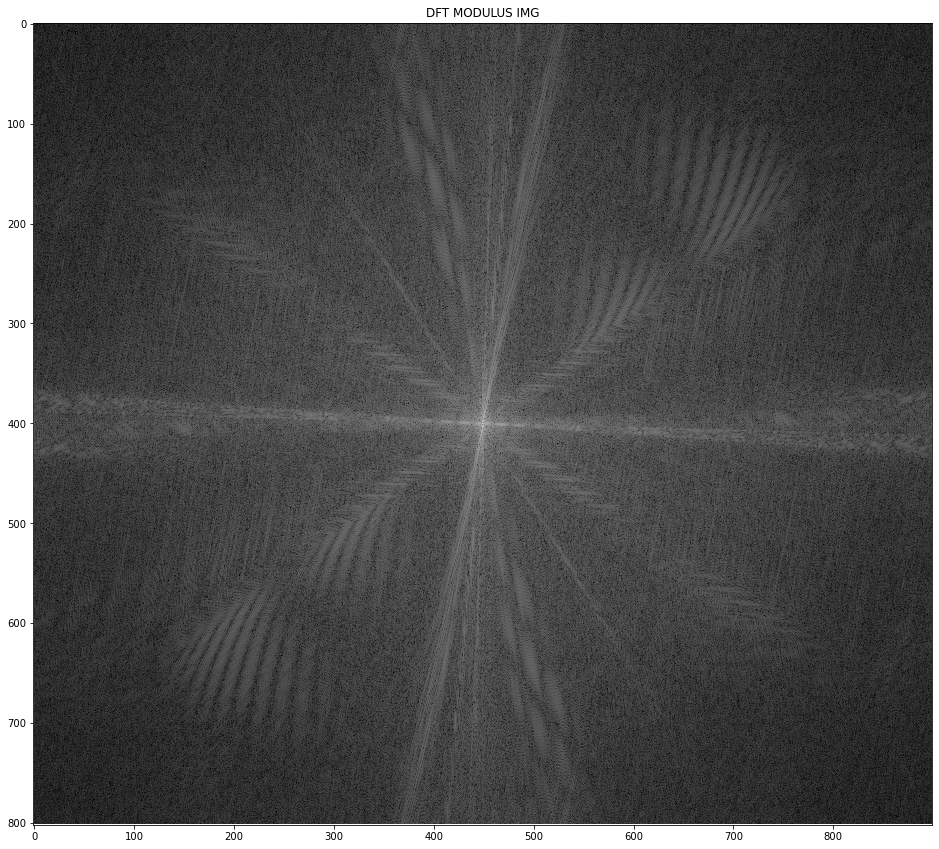

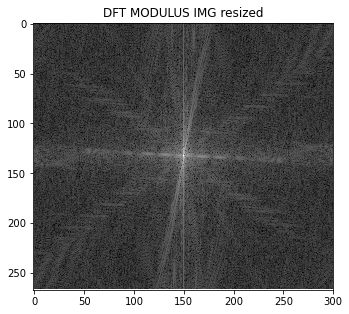

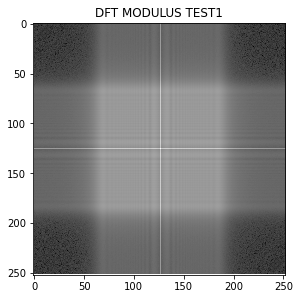

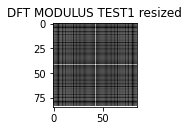

In [13]:
IMG_sub_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(img_sub))))
display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
display_image(IMG_sub_mod, title='DFT MODULUS IMG resized', size=1)

TEST1_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test1)))) # DELETE
TEST1_sub_mod = np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test1_sub))))
display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
display_image(TEST1_sub_mod, title='DFT MODULUS TEST1 resized', size=1)

Actually, the transforms being visualized show only one period of the spectrum of the images after downsampling. We are going to manipulate the transform matrices in order to display, side by side, several spectral replicas of the spectrum to show the periodicity effect. This will give a more precise idea of what is going on with the downsampling:

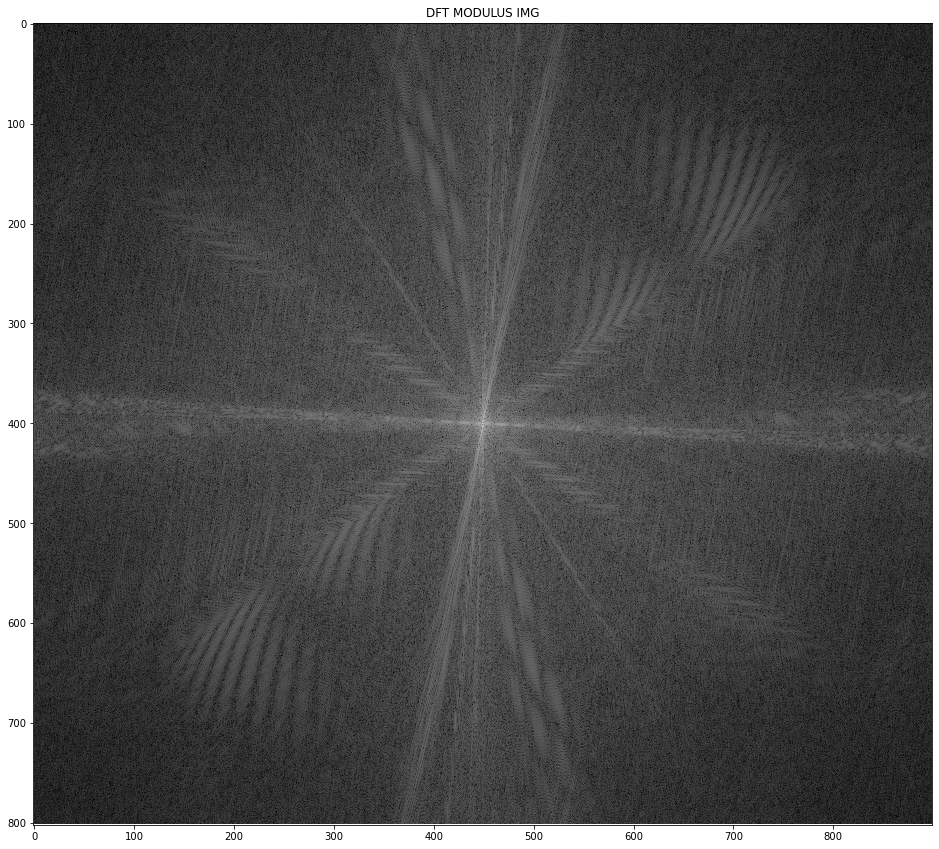

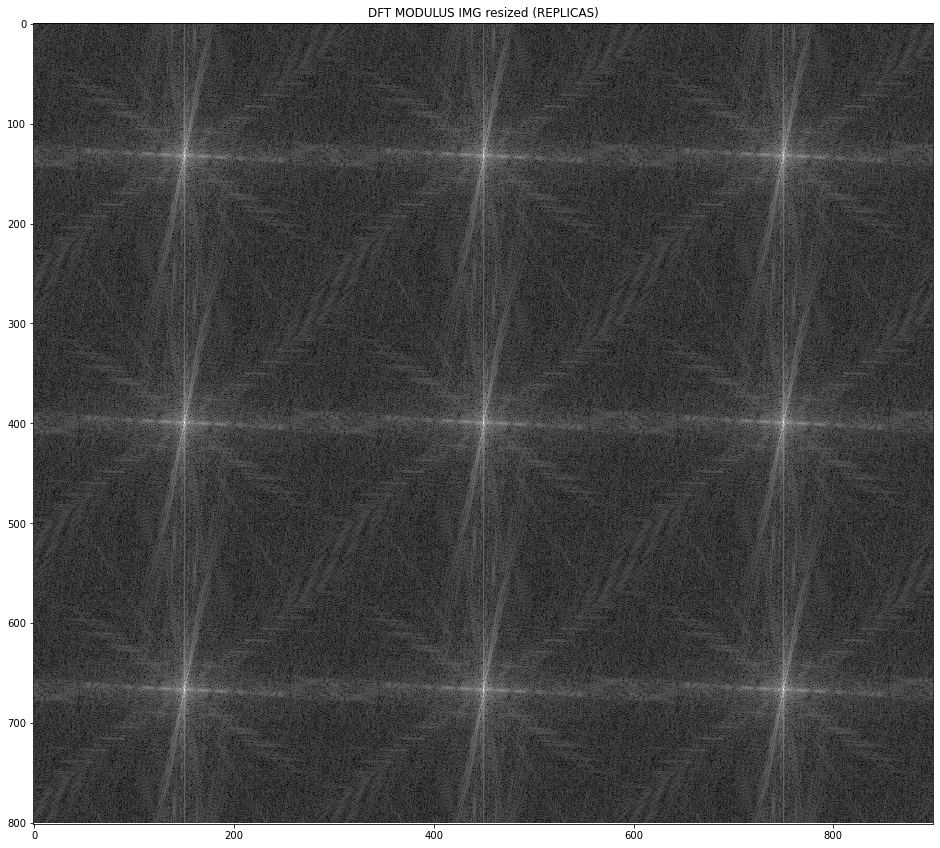

In [14]:
display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
tmp = np.hstack((IMG_sub_mod,IMG_sub_mod,IMG_sub_mod))
IMG_sub_mod_replicas = np.vstack((tmp,tmp,tmp))
display_image(IMG_sub_mod_replicas,title='DFT MODULUS IMG resized (REPLICAS)',size=1)

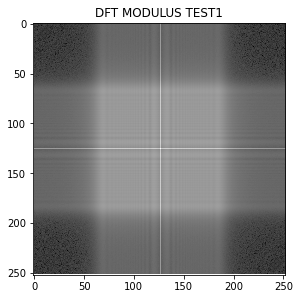

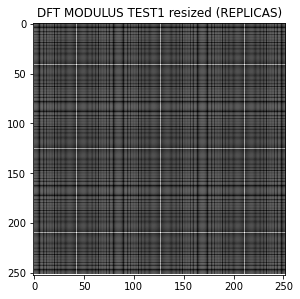

In [15]:
display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
tmp = np.hstack((TEST1_sub_mod,TEST1_sub_mod,TEST1_sub_mod))
TEST1_sub_mod_replicas = np.vstack((tmp,tmp,tmp))
display_image(TEST1_sub_mod_replicas,title='DFT MODULUS TEST1 resized (REPLICAS)',size=1)

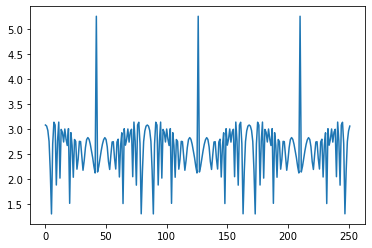

In [21]:
plt.plot(TEST1_sub_mod_replicas[100])
plt.show()

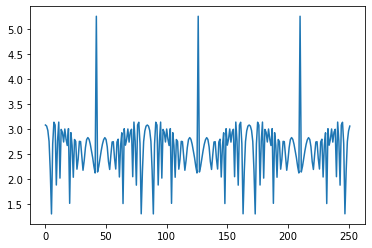

In [22]:
plt.plot(TEST1_sub_mod_replicas[:,100])
plt.show()


<font color='purple'>As we have not filtered before downsampling, could you tell in which range of frequencies
(in normalized frequency units $f_x, f_y$) of the transform image in the `TEST1` case, we
have no aliasing effect? (assume that the `TEST1` image only contains frequency components
below the frequency you have estimated at the end of section 1 and theoretically estimate
the alias free band).

Please note that when we resize figures resulting from function display_image(), there are implicit processes of downsampling and interpolation. Please use the parameter `size` of the function with caution. For instance, the effect of disappearing lines in the display of the spectrum of `TEST1_sub` when `size` is different than 1 is due to this downsampling.</font>

---

<font color='red'>Answer: As before, the frequencies are symmetric for both axes, so the conclusions are valid for both. Theoretically, we know that the frequency above which there is no aliasing will be 1/2N, where N = 3. That is, f = 0.16. If we want to know how many samples correspond to 0.16, it's as simple as multiplying by the total number of samples (250). Therefore, we have 40 samples that do not overlap. The last place where overlap will occur will be at the middle samples, as logically, the extremes are the first to overlap on the replicas of the signal. If we recall the DFT of the original image, the most characteristic peak with the two lobes was right in the middle, which here we see three times (due to downsampling by 3). This peak is roughly around sample 40, so we can assume that samples 20 to 60 remain intact. If we normalize the frequencies, we get that the aliasing-free band ranges from f = 0.08 to 0.24.
</font> 

#### Downsampling experiment

Let's experiment with the downsampling of a second image `test2`. We will generate the image `test2` as a numpy matrix by using an inverse 2D DFT transform, as follows:

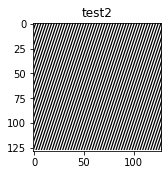

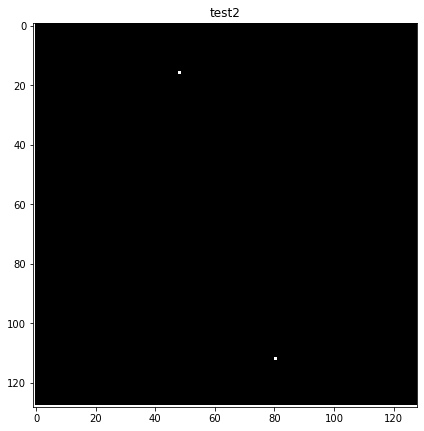

In [27]:
# create a 128x128 matrix of zeros
X = np.zeros((128,128))

# set coefficient value in 16th row, 48th column (starting with 0)
X[16,48] = 128*128

# compute the real part of the inverse 2D-DFT
test2 = np.real(np.fft.ifft2(X));

x = np.real(np.fft.fft2(test2)); 

# shifts test2 to avoid negative values
test2 = test2 + 1;
display_image(test2, title='test2', size=1)

x = x + 1;
display_image(x, title='test2', size=3)


As a reminder, direct and inverse Discrete Fourier Transforms (DFT) of an image (2D
signal) are defined as follows:

$$X[k,l] = \sum^{M-1}_{m=0}\sum^{N-1}_{n=0}x[m,n]e^{-j2\pi \left( \frac{mk}{M}+\frac{nl}{N}\right) }$$ with $0 \leq k < M-1$ and $0 \leq  l < N-1$

$$x[m,n] = \frac{1}{MN}\sum^{k=0}_ {M-1}\sum^{l=0}_ {N-1}X[k,l]e^{j2\pi\left( \frac{mk}{M} + \frac{nl}{N}  \right)}$$


To be consistent with the scikt notation, we will assume that m indicates rows (vertical
index) and n indicates columns (horizontal index). Therefore, k will be the index for the
normalized vertical frequency, and l for the horizontal frequency. Note that the DC coefficient corresponds to the $X[0,0]$ position of and the component with $(f_x ,f_y)=(16/128,48/128)$ corresponds to $X[16,48]$. 

Considering that we have just computed the real part of the inverse transform of a $128x128$ spectrum with a single non-zero value (actually, a spectrum with one delta), could you obtain the expressions requested below?


<font color='purple'>1) The analytic expression of the transform $X[k, l]$ we have just created as a function of
the 2D Kronecker delta in the transform domain (remember $\delta[k, l] = \delta[k] \cdot \delta[l]$)</font>

---
<font color='red'>Answer: Since we only have 1 non-zero value at position (16,48), the transform is a delta at that point:
    $$X[k, l] =128*128* (\delta[k - 16, l - 48])$$

</font>

<font color='purple'>2) The result of the inverse 2D DFT transform $x[m,n]=DFT^{-1}\left\{X[k, l]\right\}$ as an exponential
function in $[m,n]$.</font>

---
<font color='red'>Answer: $$x[m,n]=DFT^{-1}\left\{X[k, l]\right\}=$$ 
    $$\frac{1}{MN}\sum^{k=0}_ {M-1}\sum^{l=0}_ {N-1}X[k,l]e^{j2\pi\left( \frac{mk}{M} + \frac{nl}{N}  \right)} =$$
    $$\frac{1}{128*128}*128*128*\sum^{k=0}_ {M-1}\sum^{l=0}_ {N-1}\delta[16-k, 48-l]e^{j2\pi\left( \frac{mk}{128} + \frac{nl}{128}  \right)} = $$
    $$ e^{j2\pi\left( \frac{16m}{128} + \frac{48n}{128}  \right)}$$

</font>


<font color='purple'>3) A closed expression for the image $test2[m,n]=REAL\left\{x[m,n]\right\}+1$</font>

---
<font color='red'>Answer: Using Euler's formula, we know that
        $$e^{x}=cos(x)+j\cdot sin(x)$$
    Therefore:
    $$x[m,n] = e^{j2\pi\left( \frac{16m}{128} + \frac{48n}{128}  \right)} = cos(\frac{16m}{128} + \frac{48n}{128})+i\cdot sin(\frac{16m}{128} + \frac{48n}{128})$$
    
<font color='red'> The cosine function represents the real part of the function, thus the final result:    $$test2[m,n]=REAL\left\{x[m,n]\right\}+1 = cos(\frac{16m}{128} + \frac{48n}{128}) + 1$$

</font>

We now downsample the resulting image by a factor 2 and show both the original `test2` image and the resized version `test2_sub`:

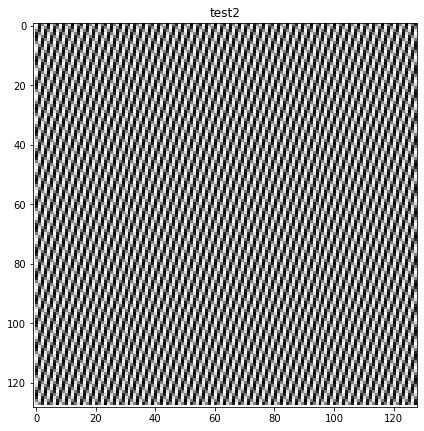

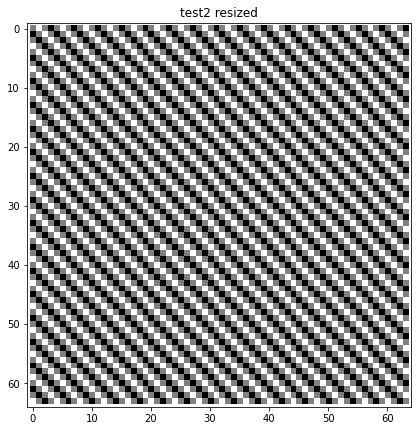

In [32]:
display_image(test2, title='test2', size=3)
test2_sub = sktf.resize(test2,np.asarray(test2.shape)/2, anti_aliasing=False, mode='constant');
display_image(test2_sub, title='test2 resized', size=6)


<font color='purple'>Compare the original `test2` and the downsampled `test2_sub` image, do you see any special effect?
Describe how the frequency of the 2D sinusoid has apparently changed with the downsampling.</font>

---
<font color='red'>Answer: We can see that the orientation of the sinusoid has changed. This is again due to aliasing and the overlapping of samples, which coincidentally reverses the orientation as the deltas in the transform have shifted positions due to aliasing effects. Additionally, obviously, we have the loss of quality as we have reduced the total number of pixels.

</font> 

Now display the transform of the two images to better understand what happened:

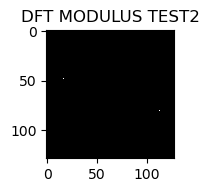

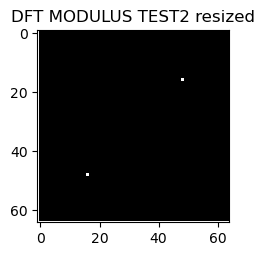

In [81]:
TEST2_mod=np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test2-1))))
TEST2_sub_mod=np.fft.fftshift(np.log(1+np.abs(np.fft.fft2(test2_sub-1))))
display_image(TEST2_mod,title='DFT MODULUS TEST2',size=1)
display_image(TEST2_sub_mod, title='DFT MODULUS TEST2 resized', size=3)

<font color='purple'>Compare the replicated spectrum of the downsampled image with the original spectrum of `test2`. Explain now more precisely the aliasing effect described in your previous answer? In particular can you compute exactly the frequency components appearing in the image after downsampling?</font>

---
<font color='red'>Answer: Mathematically, we can verify why there is this change in orientation of the sinusoid as follows:
    $$x[m,n] = sin(2\pi\frac{16}{128}m + 2\pi\frac{48}{128}n)  $$
    We downsample by 2 on both axes, so the new image is represented by the formula:
    $$y[m,n] = x[2m,2n] = sin(2\pi\frac{16*2}{128}m + 2\pi\frac{48*2}{128}n) =$$
    $$y[m,n] = sin(2\pi\frac{16}{64}m + 2\pi\frac{48}{64}n)$$
    
<font color='red'>Therefore, now a delta will be located at position [12, 48], and its symmetrical counterpart will be at [64-12, 64-48] = [54, 16], which is exactly what we observe in the second image.

</font>


In the next section, we are going to filter the image before downsampling in order to get a
better result.

## 4 Linear Filters

The direct way to filter an image is to convolve it with an impulse response. Let us
experiment with the `img` image and a gaussian impulse response:

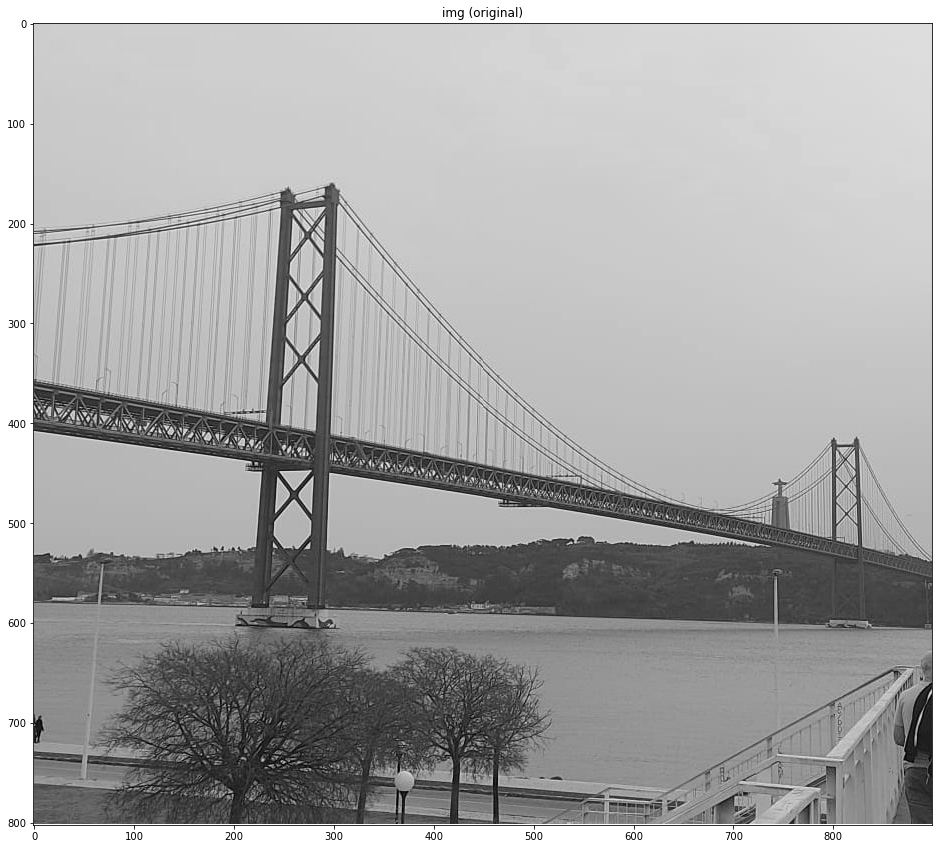

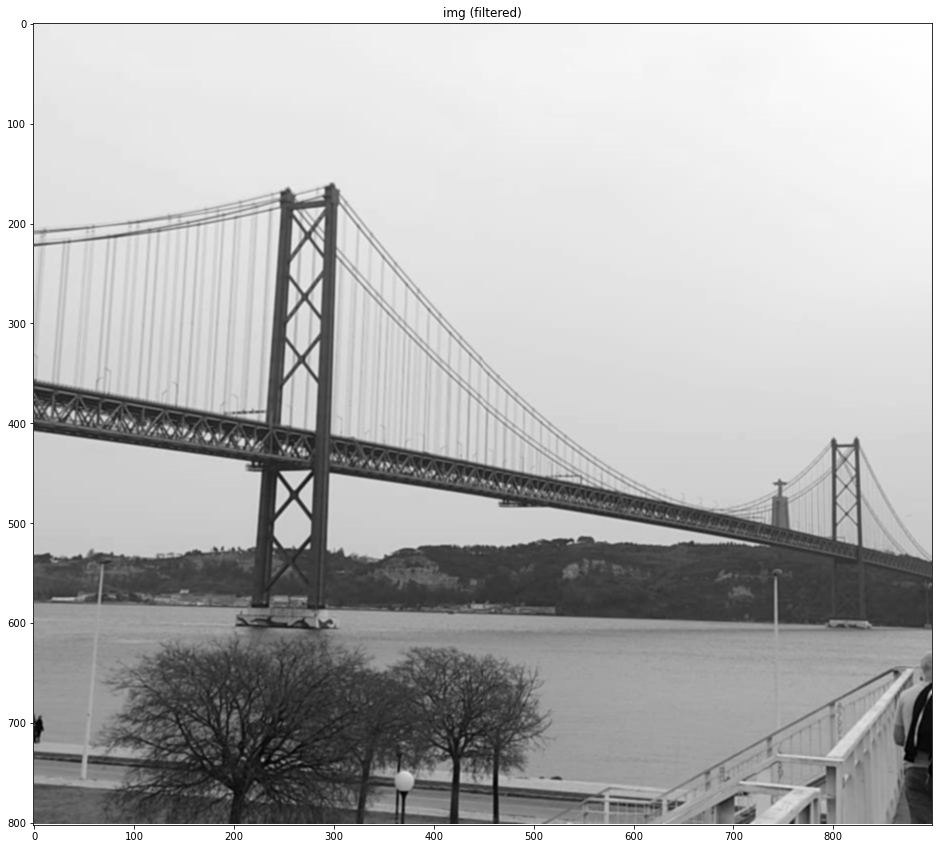

In [33]:
from skimage import filters

sigma = 1
window = 5
truncate = (((window - 1)/2)-0.5)/sigma
img_filt = filters.gaussian(img,sigma=sigma,truncate=truncate);
display_image(img,title='img (original)', size=1)
display_image(img_filt, title='img (filtered)', size=1)


<font color='purple'>Paste the image and describe the effects of this filter and relate these effects with the theoretical properties of the filter.</font>

---
<font color='red'>Answer: The Gaussian filter assigns to each pixel the average of the nearest pixels weighted with a Gaussian distribution. The filter smooths out high frequencies, resulting in much less sharp contrasts. In the photo, we can see how areas with more edges (such as the cables of the bridge or the leaves of the trees) are completely blurred, making it difficult to distinguish where one ends and another begins.

</font>

Another way to filter an image is to simply remove some transform coefficients corresponding to the frequency components to remove. However, this "Frequency Filtering" technique by means of a frequency mask is not always adequate. Let us explore
this issue.

## 5 Frequency filtering

Assume we apply a low pass filter to avoid aliasing problems when downsampling `test1`:

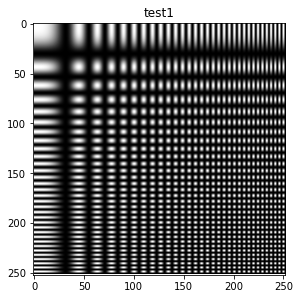

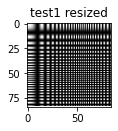

In [34]:
display_image(test1,title='test1',size=1)
display_image(test1_sub, title='test1 resized', size=1)


We could have removed all frequency components above half the new sampling frequency before downsampling by using a frequency mask as done in the following:


42.0


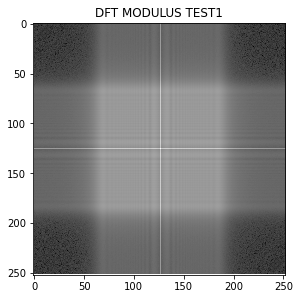

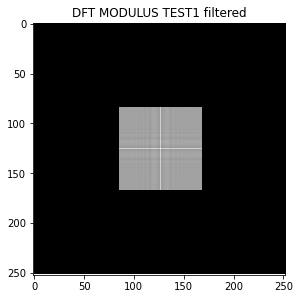

In [35]:
TEST1 = np.fft.fft2(test1)
TEST1_mod = np.fft.fftshift(np.log(1+np.abs(TEST1)))
fils = TEST1.shape[0]
cols = TEST1.shape[1]

print(cols/6)
# mask vertical frequencies
TEST1[int(1/6*fils):int(5/6*fils)+1,:] = 0;

# mask horizontal frequencies
TEST1[:,int(1/6*cols):int(5/6*cols)+1] = 0;

display_image(TEST1_mod, title='DFT MODULUS TEST1', size=1)
display_image(np.fft.fftshift(np.log(1+np.abs(TEST1))), title='DFT MODULUS TEST1 filtered', size=1)


To see the resulting image, we need to apply the inverse FFT transform:

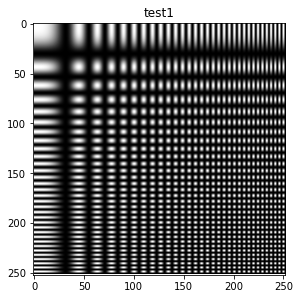

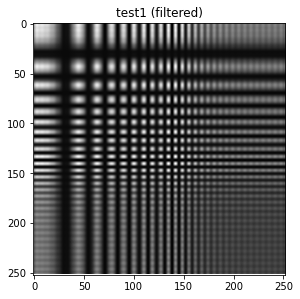

In [36]:
test1_filt = 9*np.real(np.fft.ifft2(TEST1))
display_image(test1, title='test1', size=1)
display_image(test1_filt, title='test1 (filtered)', size=1)

Now compare what happens when downsampling this result with the previous case:

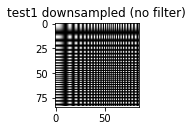

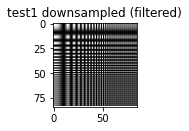

In [38]:
test1_sub  = transform.resize(test1,     np.asarray(test1.shape)/3,      anti_aliasing=False, mode='constant');
test1_sub2 = transform.resize(test1_filt,np.asarray(test1_filt.shape)/3, anti_aliasing=False, mode='constant');

display_image(test1_sub,title='test1 downsampled (no filter)', size=1)
display_image(test1_sub2,title='test1 downsampled (filtered)', size=1)


As you can see, aliasing is not present but, of course, the highest frequencies have been
removed by the low pass filter. However, this filtering technique may not always be
adequate. Let's apply the same technique to the IMG image. Then we filter it as we previously have done with test2:

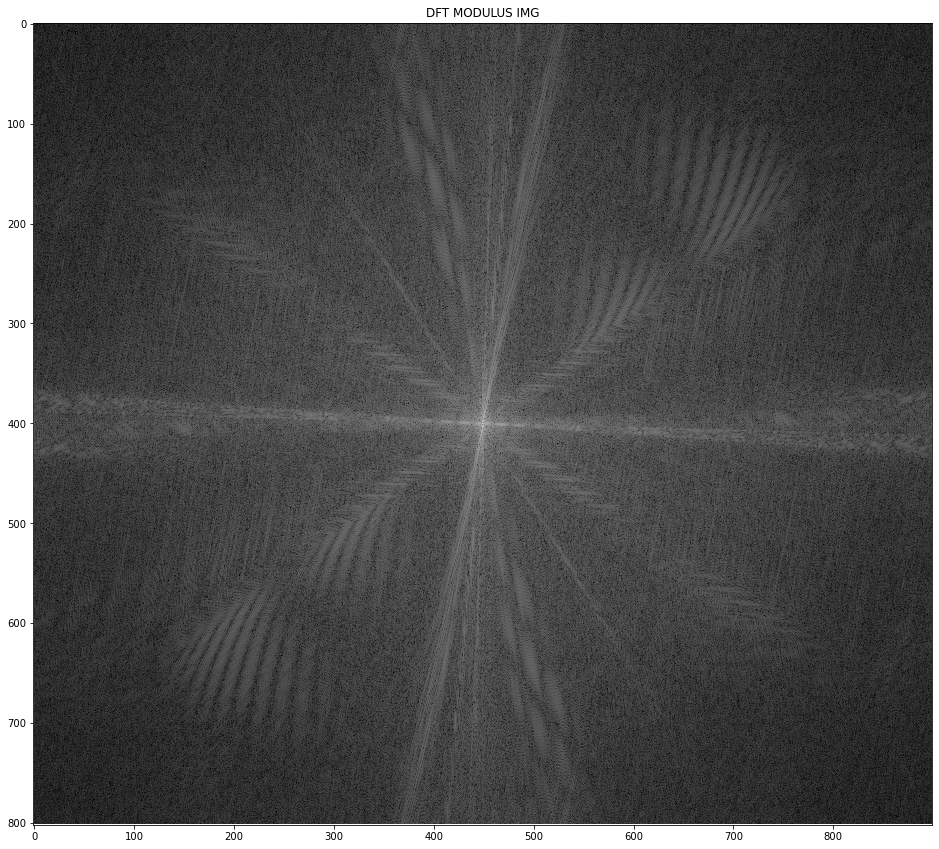

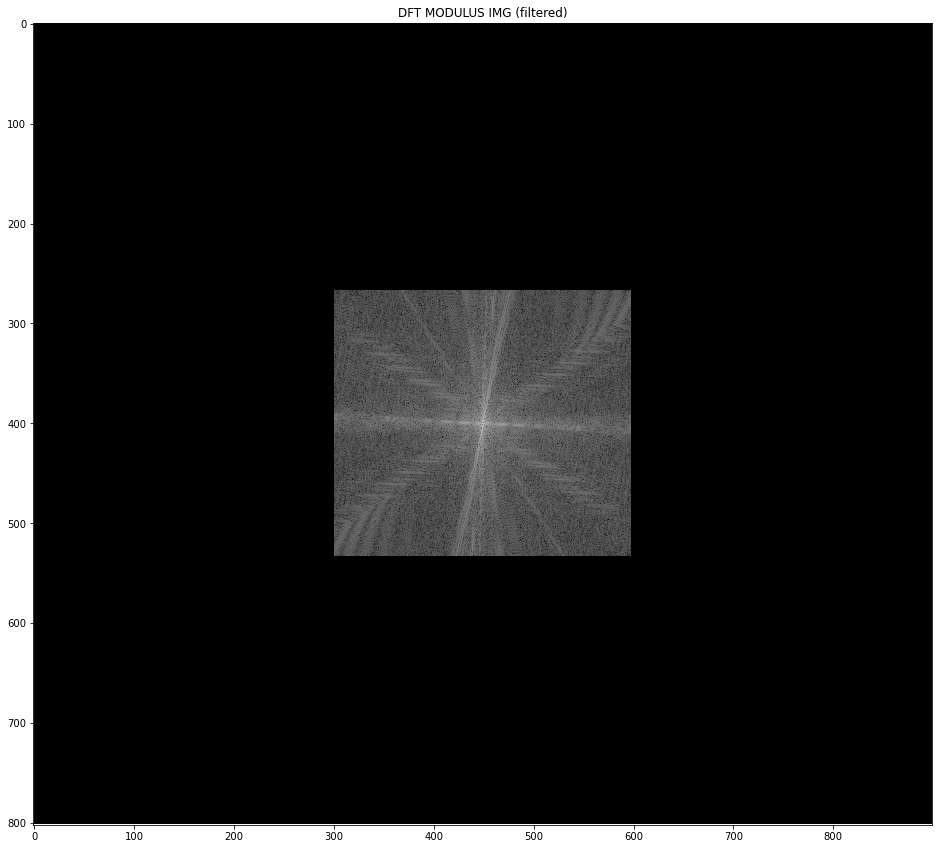

In [39]:
IMG = np.fft.fft2(img)
IMG_mod = np.fft.fftshift(np.log(1+abs(IMG)))
fils = IMG.shape[0]
cols = IMG.shape[1]
# mask vertical frequencies
IMG[int(1/6*fils):int(5/6*fils)+1,:] = 0
# mask horizontalal frequencies
IMG[:,int(1/6*cols):int(5/6*cols)+1] = 0

display_image(IMG_mod, title='DFT MODULUS IMG', size=1)
display_image(np.fft.fftshift(np.log(1+np.abs(IMG))), title='DFT MODULUS IMG (filtered)', size=1)

Let's see now the result of the inverse transform:


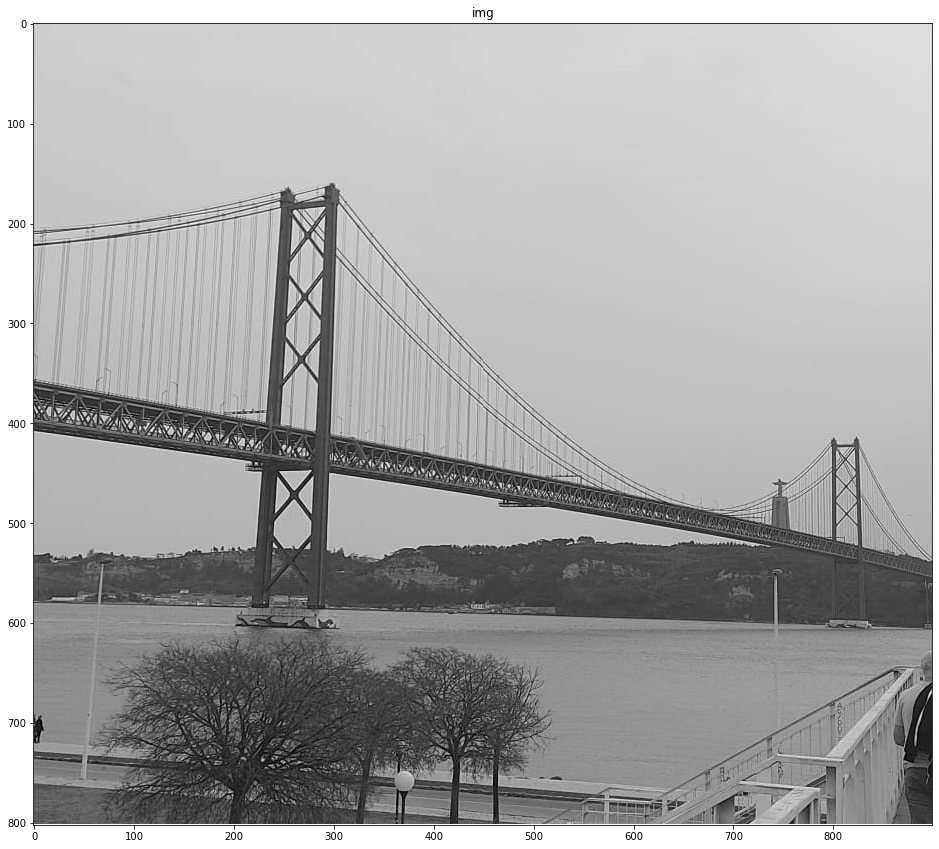

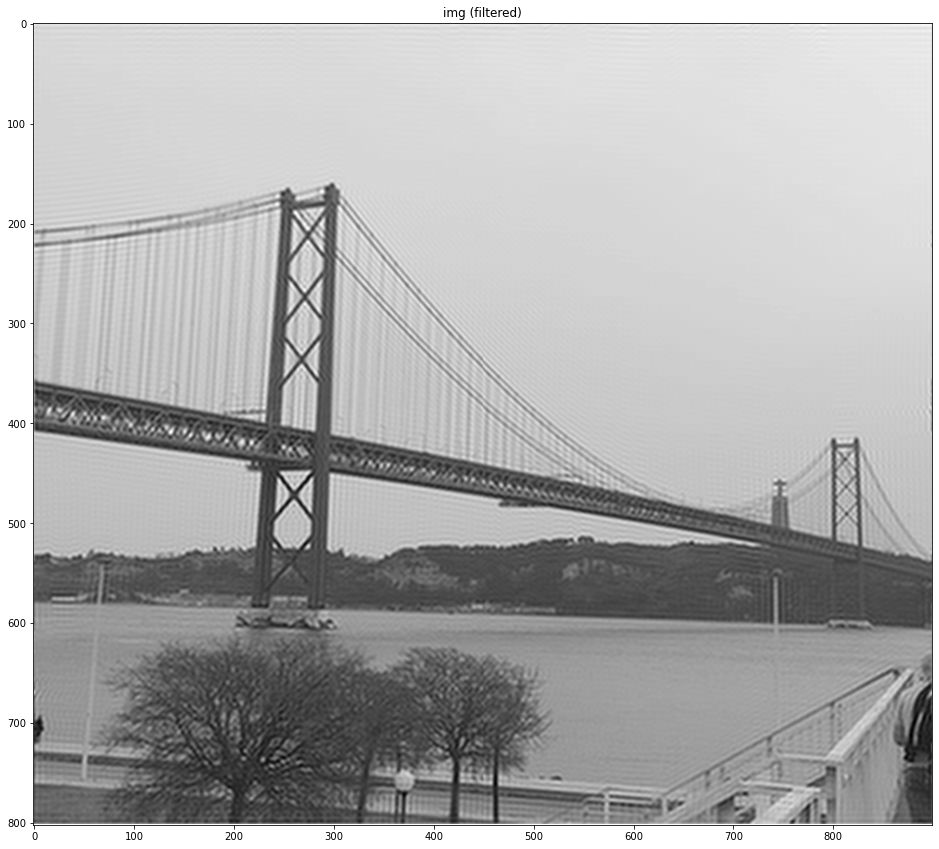

In [40]:
img_filt = 9*np.real(np.fft.ifft2(IMG));
display_image(img, title='img', size=1)
display_image(img_filt, title='img (filtered)', size=1)

<font color='purple'>Maximize the window to better see the result. Can you explain this effect?</font>

---
<font color='red'>Answer: The effect we see occurs in areas with edges or contrasts, in other words, it affects high-frequency areas. This is because when applying the low-pass filter, we eliminate all high frequencies, and the changes that were previously smooth are now much more abrupt, creating square shapes. In areas like the sky, where there is no change in intensity, we don't see these squares.

## 6 Removal of a sinusoidal interference

We can use notch filters to remove some kinds of interference. Imagine that the `img` image has been corrupted by a sinusoidal interference as follows. First, we generate the interferring signal. We follow the same process than in section
"Transform Domain":


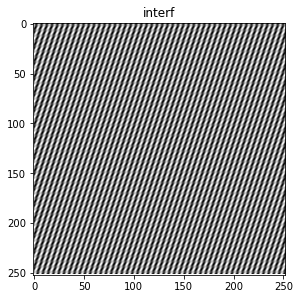

In [41]:
# resize img to a 252x252 image
img2 = transform.resize(img,(252,252), anti_aliasing=True, mode='constant');

# create a 252x252 matrix of zeros
INTERF = np.zeros(img2.shape)

# set some energy at coefficient X(16,48)
INTERF[16,48] = 4000

# same at the X(64,48)
INTERF[64,48] = 1000

# inverse transform to compute the interferring image
interf = np.real(np.fft.ifft2(INTERF)+1)

display_image(interf, title='interf', size=1)


And now we corrupt the `img2`  image by adding `interf`:



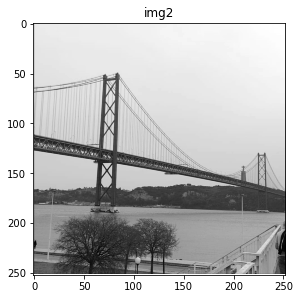

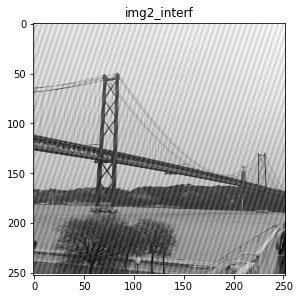

In [42]:
img2_interf = interf + img2/np.amax(img2)
display_image(img2, title='img2', size=1)
display_image(img2_interf, title='img2_interf', size=1)

Let's see the spectrum of the corrupted image:


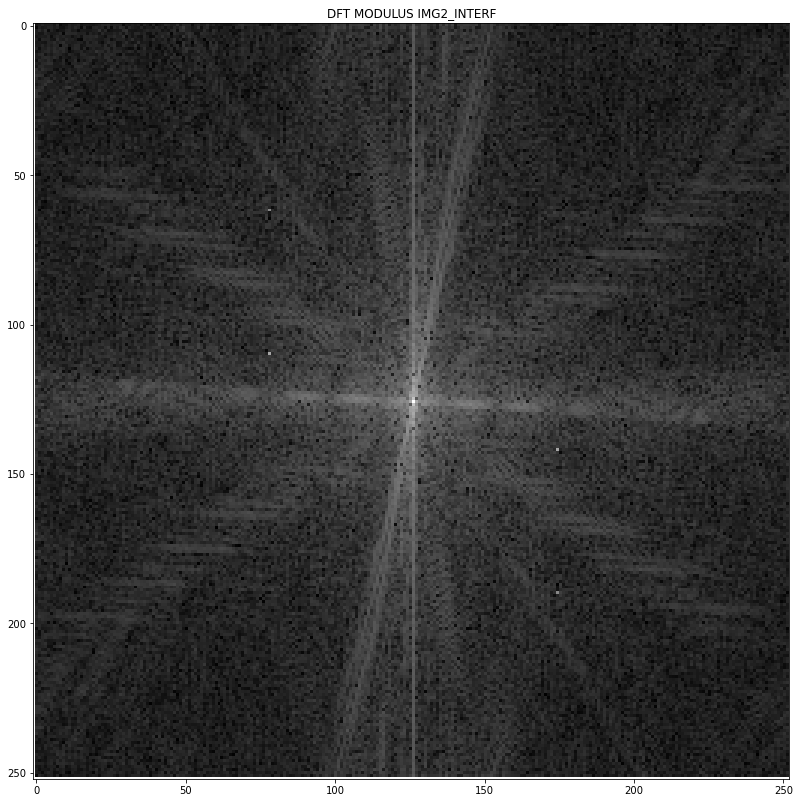

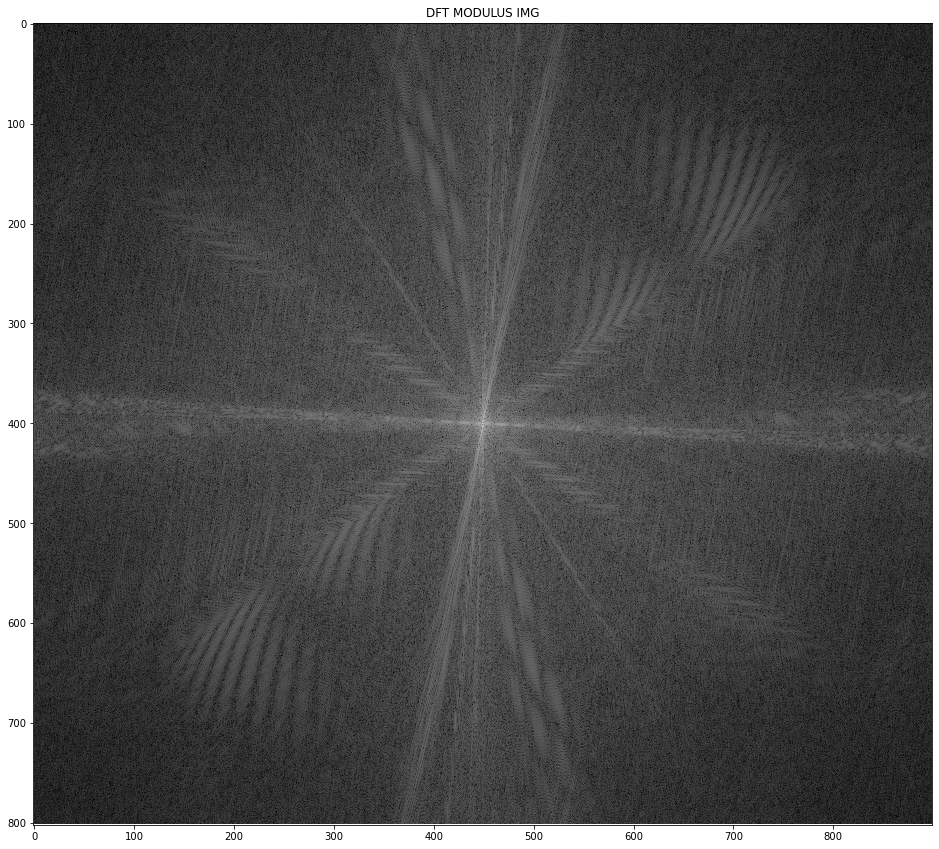

In [46]:
IMG2_INTERF = np.fft.fft2(img2_interf);
display_image(np.fft.fftshift(np.log(1+np.abs(IMG2_INTERF))), title='DFT MODULUS IMG2_INTERF', size=3)
display_image(IMG_mod, title='DFT MODULUS IMG', size=1)

Can you appreciate the interferring coefficients? (play with the `size` parameter to help you see it)

<font color='purple'>Using the method of frequency filtering, try to remove the interference from the image `img2_interf`. You can use a "notch" filter to eliminate the interfering coefficients of high energy in the transform. Write the corresponding commands and explain the strategy you have followed:
</font>

---
<font color='red'>Answer: Zooming in enough on the transformed image, we can clearly see 4 white points indicating an excess of frequencies. These points correspond to the deltas of the Fourier transform of the sinusoidal signal. If we remove these frequencies, we should end up with almost the same original image but completely removing the noise.

</font> 

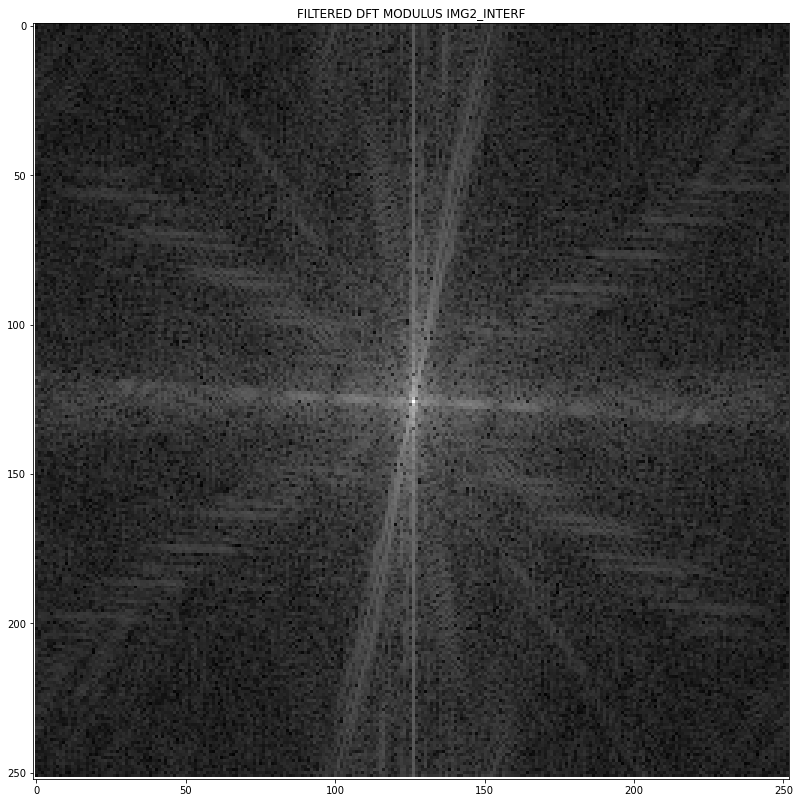

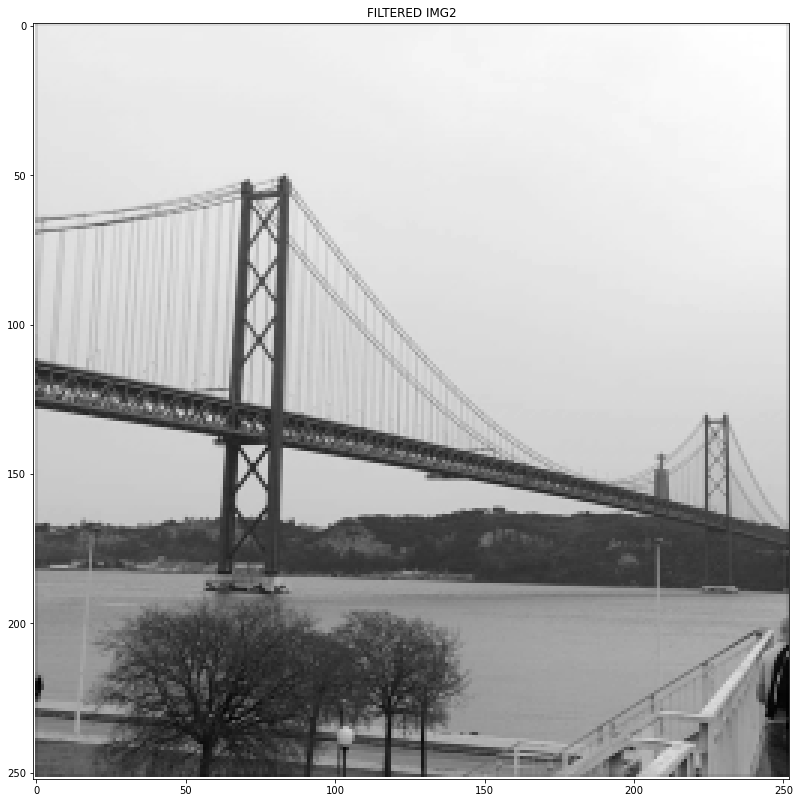

In [47]:
# Write below the commands you need

# Create a filter mask
mask = np.ones_like(IMG2_INTERF)
mask[16,48] = 0  # set the interfering coefficient to zero
mask[252-16,252-48] = 0
mask[64,48] = 0
mask[252-64,252-48] = 0


# Apply the notch filter
IMG2_INTERF_FILTERED = IMG2_INTERF * mask

# Display the filtered Fourier transform
display_image(np.fft.fftshift(np.log(1+np.abs(IMG2_INTERF_FILTERED))), title='FILTERED DFT MODULUS IMG2_INTERF', size=3)

# Obtain the filtered image
img2_filtered = np.real(np.fft.ifft2(IMG2_INTERF_FILTERED))

# Display the filtered image
display_image(img2_filtered, title='FILTERED IMG2', size=3)